In [1]:
# Import Some Basic Packages
import os
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
%matplotlib inline
sns.set()
import warnings
warnings.filterwarnings("ignore")
from sklearn.preprocessing import MinMaxScaler
from sklearn.ensemble import RandomForestClassifier
from xgboost import XGBClassifier
from sklearn.model_selection import train_test_split
from sklearn.metrics import accuracy_score,confusion_matrix,classification_report



In [5]:
pd.set_option("display.max_columns",None)
pd.set_option("display.max_rows",None)
pd.set_option("display.width",None)


In [2]:
df=pd.read_csv("D:\Data Set ML\kidney_disease.csv")
df.head(2)

,id,age,bp,sg,al,su,rbc,pc,pcc,ba,...,pcv,wc,rc,htn,dm,cad,appet,pe,ane,classification
0,0,48.0,80.0,1.02,1.0,0.0,NaN,normal,notpresent,notpresent,...,44,7800,5.2,yes,yes,no,good,no,no,ckd
1,1,7.0,50.0,1.02,4.0,0.0,NaN,normal,notpresent,notpresent,...,38,6000,NaN,no,no,no,good,no,no,ckd


In [3]:
import pandas_profiling as pf

In [4]:
profile_report=pf.ProfileReport(df)
profile_report

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

In [13]:
df.shape

(400, 26)

In [16]:
df.isnull().sum()[df.isnull().sum()>0]

age        9
bp        12
sg        47
al        46
su        49
rbc      152
pc        65
pcc        4
ba         4
bgr       44
bu        19
sc        17
sod       87
pot       88
hemo      52
pcv       70
wc       105
rc       130
htn        2
dm         2
cad        2
appet      1
pe         1
ane        1
dtype: int64

In [17]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 400 entries, 0 to 399
Data columns (total 26 columns):
 #   Column          Non-Null Count  Dtype  
---  ------          --------------  -----  
 0   id              400 non-null    int64  
 1   age             391 non-null    float64
 2   bp              388 non-null    float64
 3   sg              353 non-null    float64
 4   al              354 non-null    float64
 5   su              351 non-null    float64
 6   rbc             248 non-null    object 
 7   pc              335 non-null    object 
 8   pcc             396 non-null    object 
 9   ba              396 non-null    object 
 10  bgr             356 non-null    float64
 11  bu              381 non-null    float64
 12  sc              383 non-null    float64
 13  sod             313 non-null    float64
 14  pot             312 non-null    float64
 15  hemo            348 non-null    float64
 16  pcv             330 non-null    object 
 17  wc              295 non-null    obj

In [20]:
# Impute Null Values using Simple -Imputer Method
from sklearn.impute import SimpleImputer
simp_impu=SimpleImputer(missing_values=np.nan, strategy="most_frequent")
df_imputed=pd.DataFrame(simp_impu.fit_transform(df))
df_imputed.columns = df.columns
df_imputed

,id,age,bp,sg,al,su,rbc,pc,pcc,ba,bgr,bu,sc,sod,pot,hemo,pcv,wc,rc,htn,dm,cad,appet,pe,ane,classification
0,0,48.0,80.0,1.02,1.0,0.0,normal,normal,notpresent,notpresent,121.0,36.0,1.2,135.0,3.5,15.4,44,7800,5.2,yes,yes,no,good,no,no,ckd
1,1,7.0,50.0,1.02,4.0,0.0,normal,normal,notpresent,notpresent,99.0,18.0,0.8,135.0,3.5,11.3,38,6000,5.2,no,no,no,good,no,no,ckd
2,2,62.0,80.0,1.01,2.0,3.0,normal,normal,notpresent,notpresent,423.0,53.0,1.8,135.0,3.5,9.6,31,7500,5.2,no,yes,no,poor,no,yes,ckd
3,3,48.0,70.0,1.005,4.0,0.0,normal,abnormal,present,notpresent,117.0,56.0,3.8,111.0,2.5,11.2,32,6700,3.9,yes,no,no,poor,yes,yes,ckd
4,4,51.0,80.0,1.01,2.0,0.0,normal,normal,notpresent,notpresent,106.0,26.0,1.4,135.0,3.5,11.6,35,7300,4.6,no,no,no,good,no,no,ckd
5,5,60.0,90.0,1.015,3.0,0.0,normal,normal,notpresent,notpresent,74.0,25.0,1.1,142.0,3.2,12.2,39,7800,4.4,yes,yes,no,good,yes,no,ckd
6,6,68.0,70.0,1.01,0.0,0.0,normal,normal,notpresent,notpresent,100.0,54.0,24.0,104.0,4.0,12.4,36,9800,5.2,no,no,no,good,no,no,ckd
7,7,24.0,80.0,1.015,2.0,4.0,normal,abnormal,notpresent,notpresent,410.0,31.0,1.1,135.0,3.5,12.4,44,6900,5,no,yes,no,good,yes,no,ckd
8,8,52.0,100.0,1.015,3.0,0.0,normal,abnormal,present,notpresent,138.0,60.0,1.9,135.0,3.5,10.8,33,9600,4.0,yes,yes,no,good,no,yes,ckd
9,9,53.0,90.0,1.02,2.0,0.0,abnormal,abnormal,present,notpresent,70.0,107.0,7.2,114.0,3.7,9.5,29,12100,3.7,yes,yes,no,poor,no,yes,ckd


In [22]:
df_imputed.isnull().sum()

id                0
age               0
bp                0
sg                0
al                0
su                0
rbc               0
pc                0
pcc               0
ba                0
bgr               0
bu                0
sc                0
sod               0
pot               0
hemo              0
pcv               0
wc                0
rc                0
htn               0
dm                0
cad               0
appet             0
pe                0
ane               0
classification    0
dtype: int64

In [24]:
# Finding The Values In The Column 
for i in df_imputed.columns:
    print("*************************************",
         i,"************************************")
    print()
    print(set(df_imputed[i].tolist()))

************************************* id ************************************

{0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 85, 86, 87, 88, 89, 90, 91, 92, 93, 94, 95, 96, 97, 98, 99, 100, 101, 102, 103, 104, 105, 106, 107, 108, 109, 110, 111, 112, 113, 114, 115, 116, 117, 118, 119, 120, 121, 122, 123, 124, 125, 126, 127, 128, 129, 130, 131, 132, 133, 134, 135, 136, 137, 138, 139, 140, 141, 142, 143, 144, 145, 146, 147, 148, 149, 150, 151, 152, 153, 154, 155, 156, 157, 158, 159, 160, 161, 162, 163, 164, 165, 166, 167, 168, 169, 170, 171, 172, 173, 174, 175, 176, 177, 178, 179, 180, 181, 182, 183, 184, 185, 186, 187, 188, 189, 190, 191, 192, 193, 194, 195, 196, 197, 198, 199, 200, 201, 202, 203, 204, 205, 

In [23]:
df_imputed["classification"] =df_imputed["classification"].apply(lambda x:"ckd" if x=="ckd\t" else x)

In [27]:
df_imputed["classification"].value_counts()

ckd       250
notckd    150
Name: classification, dtype: int64

In [29]:
df_imputed["pcv"].mode()

0    41
Name: pcv, dtype: object

In [30]:
# pcv
df_imputed['pcv'] = df_imputed['pcv'].apply(lambda x:'41' if x=='\t?' else x)
df_imputed['pcv'] = df_imputed['pcv'].apply(lambda x:'43' if x== '\t43' else x)

In [31]:
df_imputed['wc'].mode()

0    9800
Name: wc, dtype: object

In [32]:
# wc
df_imputed['wc'] = df_imputed['wc'].apply(lambda x:'9800' if x=='\t?' else x)
df_imputed['wc'] = df_imputed['wc'].apply(lambda x:'8400' if x== '\t8400' else x)
df_imputed['wc'] = df_imputed['wc'].apply(lambda x:'6200' if x== '\t6200' else x)

In [33]:
df_imputed['rc'].mode()

0    5.2
Name: rc, dtype: object

In [34]:
# wc
df_imputed['rc'] = df_imputed['rc'].apply(lambda x:'5.2' if x=='\t?' else x)

In [35]:
# dm
df_imputed['dm'] = df_imputed['dm'].apply(lambda x:'no' if x=='\tno' else x)
df_imputed['dm'] = df_imputed['dm'].apply(lambda x:'yes' if x=='\tyes' else x)
df_imputed['dm'] = df_imputed['dm'].apply(lambda x:'yes' if x== ' yes' else x)

In [36]:
# cad
df_imputed['cad'] = df_imputed['cad'].apply(lambda x:'no' if x=='\tno' else x)

AxesSubplot(0.125,0.125;0.775x0.755)


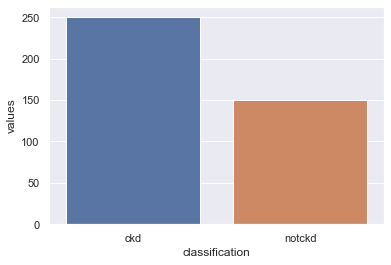

In [37]:
temp=df_imputed["classification"].value_counts()
temp_df=pd.DataFrame({"classification":temp.index ,"values":temp.values})
print(sns.barplot(x="classification",y="values",data=temp_df))
plt.show()

In [38]:
for i in df.select_dtypes(exclude=['object']).columns:
    df_imputed[i]=df_imputed[i].apply(lambda x: float(x))

In [42]:
df_imputed.dtypes

id                float64
age               float64
bp                float64
sg                float64
al                float64
su                float64
rbc                object
pc                 object
pcc                object
ba                 object
bgr               float64
bu                float64
sc                float64
sod               float64
pot               float64
hemo              float64
pcv                object
wc                 object
rc                 object
htn                object
dm                 object
cad                object
appet              object
pe                 object
ane                object
classification     object
dtype: object

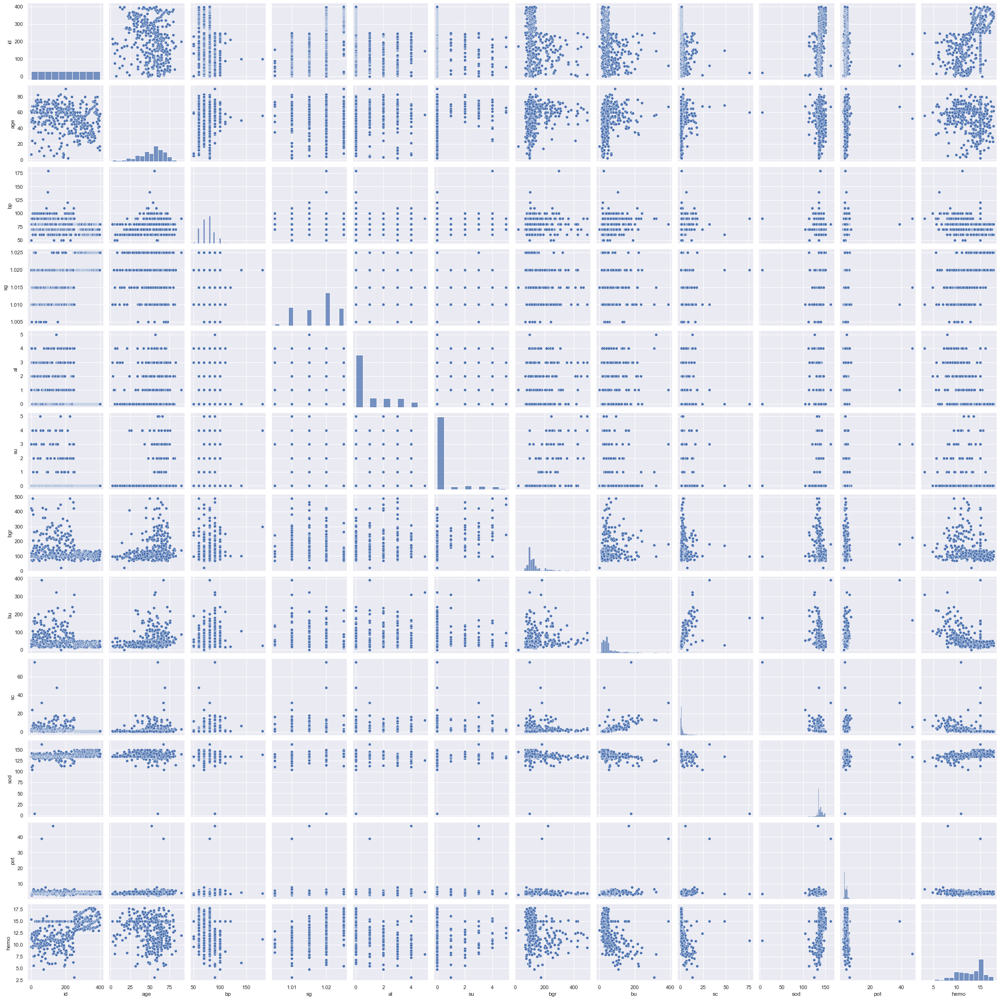

In [43]:
sns.pairplot(df_imputed)

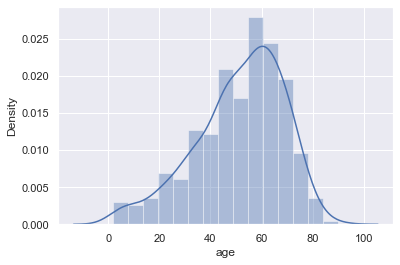

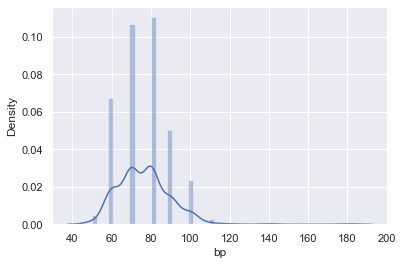

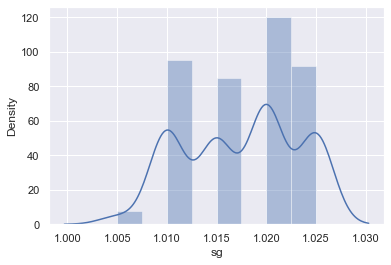

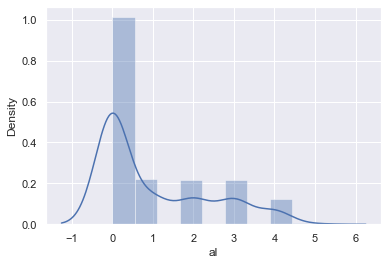

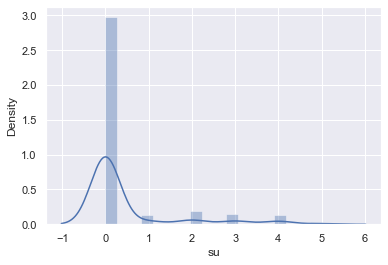

...

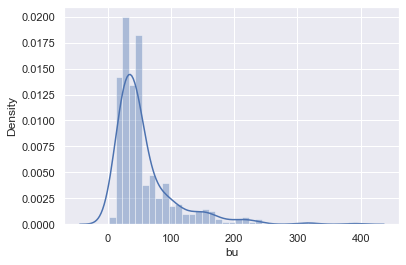

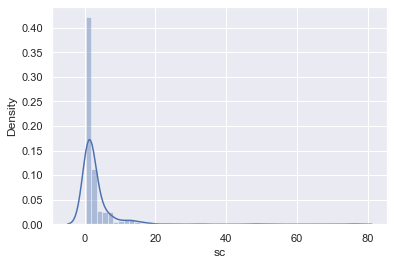

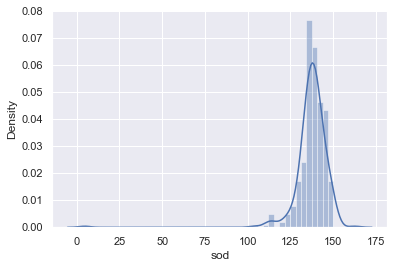

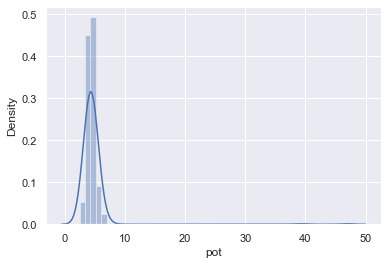

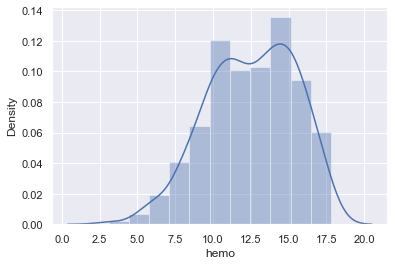

In [44]:
# Find the distribution of data

def distplots(col):
    sns.distplot(df[col])
    plt.show()
    
for i in list(df.select_dtypes(exclude=['object']).columns)[1:]:
    distplots(i)

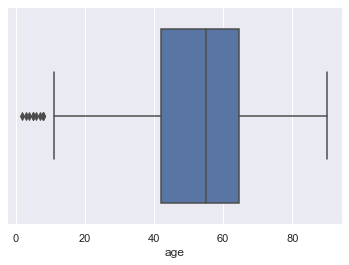

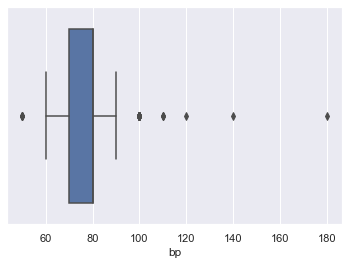

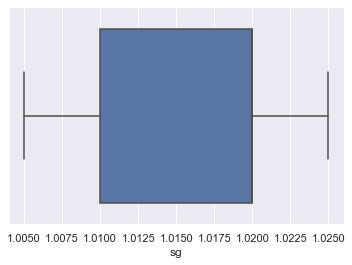

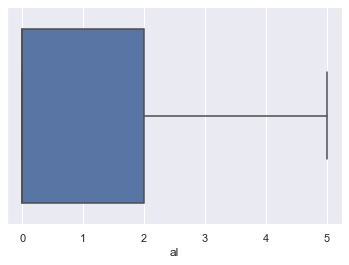

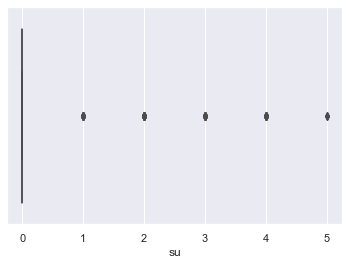

...

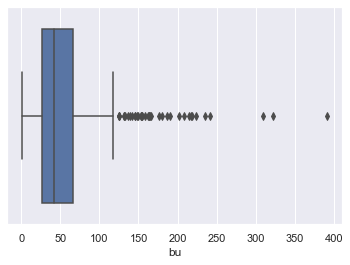

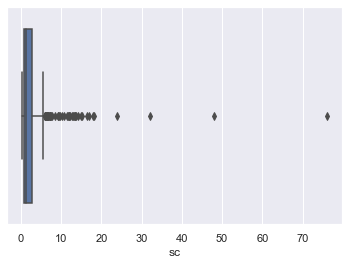

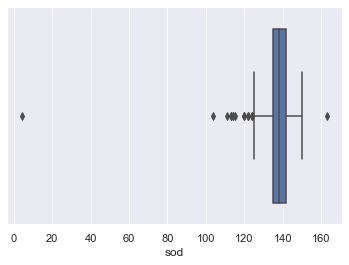

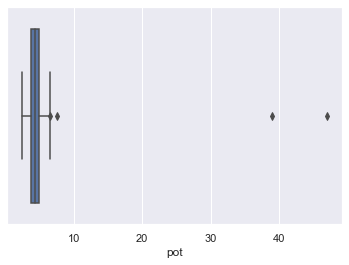

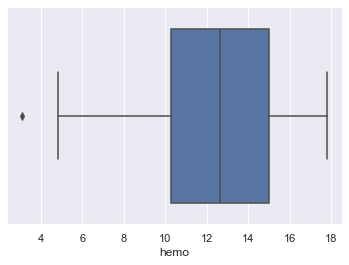

In [45]:
# check outlier

def boxplots(col):
    sns.boxplot(df[col])
    plt.show()
    
for i in list(df.select_dtypes(exclude=['object']).columns)[1:]:
    boxplots(i)

In [46]:
df_imputed.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 400 entries, 0 to 399
Data columns (total 26 columns):
 #   Column          Non-Null Count  Dtype  
---  ------          --------------  -----  
 0   id              400 non-null    float64
 1   age             400 non-null    float64
 2   bp              400 non-null    float64
 3   sg              400 non-null    float64
 4   al              400 non-null    float64
 5   su              400 non-null    float64
 6   rbc             400 non-null    object 
 7   pc              400 non-null    object 
 8   pcc             400 non-null    object 
 9   ba              400 non-null    object 
 10  bgr             400 non-null    float64
 11  bu              400 non-null    float64
 12  sc              400 non-null    float64
 13  sod             400 non-null    float64
 14  pot             400 non-null    float64
 15  hemo            400 non-null    float64
 16  pcv             400 non-null    object 
 17  wc              400 non-null    obj

In [48]:
# Label encoding to convert categorical values to numerical 
from sklearn import preprocessing
df_enco = df_imputed.apply(preprocessing.LabelEncoder().fit_transform)
df_enco

,id,age,bp,sg,al,su,rbc,pc,pcc,ba,bgr,bu,sc,sod,pot,hemo,pcv,wc,rc,htn,dm,cad,appet,pe,ane,classification
0,0,40,3,3,1,0,1,1,0,0,48,23,8,19,8,90,30,69,33,1,1,0,0,0,0,0
1,1,5,0,3,4,0,1,1,0,0,26,5,4,19,8,49,24,53,33,0,0,0,0,0,0,0
2,2,54,3,1,2,3,1,1,0,0,140,40,14,19,8,32,17,67,33,0,1,0,1,0,1,0
3,3,40,2,0,4,0,1,0,1,0,44,43,32,2,0,48,18,59,18,1,0,0,1,1,1,0
4,4,43,3,1,2,0,1,1,0,0,33,13,10,19,8,52,21,65,26,0,0,0,0,0,0,0
5,5,52,4,2,3,0,1,1,0,0,2,12,7,26,5,58,25,69,24,1,1,0,0,1,0,0
6,6,60,2,1,0,0,1,1,0,0,27,41,80,1,13,60,22,87,33,0,0,0,0,0,0,0
7,7,17,3,2,2,4,1,0,0,0,138,18,7,19,8,60,30,61,30,0,1,0,0,1,0,0
8,8,44,5,2,3,0,1,0,1,0,62,46,15,19,8,44,19,85,20,1,1,0,0,0,1,0
9,9,45,4,3,2,0,0,0,1,0,1,79,51,4,10,31,15,15,16,1,1,0,1,0,1,0


In [49]:
df_enco.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 400 entries, 0 to 399
Data columns (total 26 columns):
 #   Column          Non-Null Count  Dtype
---  ------          --------------  -----
 0   id              400 non-null    int64
 1   age             400 non-null    int64
 2   bp              400 non-null    int64
 3   sg              400 non-null    int64
 4   al              400 non-null    int64
 5   su              400 non-null    int64
 6   rbc             400 non-null    int32
 7   pc              400 non-null    int32
 8   pcc             400 non-null    int32
 9   ba              400 non-null    int32
 10  bgr             400 non-null    int64
 11  bu              400 non-null    int64
 12  sc              400 non-null    int64
 13  sod             400 non-null    int64
 14  pot             400 non-null    int64
 15  hemo            400 non-null    int64
 16  pcv             400 non-null    int32
 17  wc              400 non-null    int32
 18  rc              400 non-null  

In [50]:
df_enco.head()

,id,age,bp,sg,al,su,rbc,pc,pcc,ba,bgr,bu,sc,sod,pot,hemo,pcv,wc,rc,htn,dm,cad,appet,pe,ane,classification
0,0,40,3,3,1,0,1,1,0,0,48,23,8,19,8,90,30,69,33,1,1,0,0,0,0,0
1,1,5,0,3,4,0,1,1,0,0,26,5,4,19,8,49,24,53,33,0,0,0,0,0,0,0
2,2,54,3,1,2,3,1,1,0,0,140,40,14,19,8,32,17,67,33,0,1,0,1,0,1,0
3,3,40,2,0,4,0,1,0,1,0,44,43,32,2,0,48,18,59,18,1,0,0,1,1,1,0
4,4,43,3,1,2,0,1,1,0,0,33,13,10,19,8,52,21,65,26,0,0,0,0,0,0,0


<AxesSubplot:>

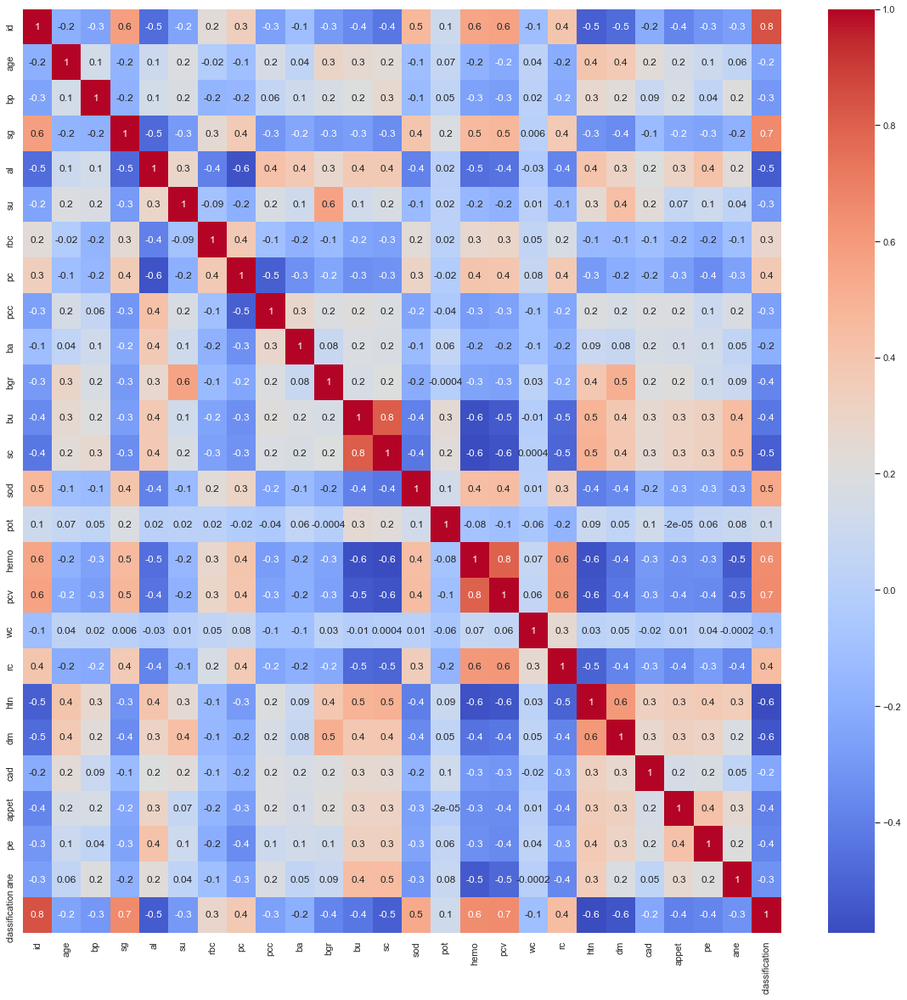

In [73]:
# Finding correlations
plt.figure(figsize=(20,20))
corr = df_enco.corr()
sns.heatmap(corr, annot=True, cmap='coolwarm',fmt=".1g")

In [52]:
# split the data into independent and dependent variable
x = df_enco.drop(['id','classification'], axis=1)
y = df_enco['classification']

In [53]:
x.head()

,age,bp,sg,al,su,rbc,pc,pcc,ba,bgr,bu,sc,sod,pot,hemo,pcv,wc,rc,htn,dm,cad,appet,pe,ane
0,40,3,3,1,0,1,1,0,0,48,23,8,19,8,90,30,69,33,1,1,0,0,0,0
1,5,0,3,4,0,1,1,0,0,26,5,4,19,8,49,24,53,33,0,0,0,0,0,0
2,54,3,1,2,3,1,1,0,0,140,40,14,19,8,32,17,67,33,0,1,0,1,0,1
3,40,2,0,4,0,1,0,1,0,44,43,32,2,0,48,18,59,18,1,0,0,1,1,1
4,43,3,1,2,0,1,1,0,0,33,13,10,19,8,52,21,65,26,0,0,0,0,0,0


In [54]:
y.head()

0    0
1    0
2    0
3    0
4    0
Name: classification, dtype: int32

In [55]:
# Imbalance dataset 

import imblearn
from imblearn.over_sampling import RandomOverSampler
from collections import Counter
print(Counter(y))

Counter({0: 250, 1: 150})


In [56]:
ros = RandomOverSampler()
x_ros, y_ros = ros.fit_resample(x,y)
print(Counter(y_ros))

Counter({0: 250, 1: 250})


In [57]:
# MinMaxScaler
scaler = MinMaxScaler((-1,1))
x = scaler.fit_transform(x_ros)
y = y_ros

In [58]:
x

array([[ 0.06666667, -0.33333333,  0.5       , ..., -1.        ,
        -1.        , -1.        ],
       [-0.86666667, -1.        ,  0.5       , ..., -1.        ,
        -1.        , -1.        ],
       [ 0.44      , -0.33333333, -0.5       , ...,  1.        ,
        -1.        ,  1.        ],
       ...,
       [ 0.04      , -0.33333333,  1.        , ..., -1.        ,
        -1.        , -1.        ],
       [ 0.49333333, -0.77777778,  0.5       , ..., -1.        ,
        -1.        , -1.        ],
       [ 0.28      , -0.33333333,  1.        , ..., -1.        ,
        -1.        , -1.        ]])

In [59]:
y

0      0
1      0
2      0
3      0
4      0
5      0
6      0
7      0
8      0
9      0
10     0
11     0
12     0
13     0
14     0
15     0
16     0
17     0
18     0
19     0
20     0
21     0
22     0
23     0
24     0
25     0
26     0
27     0
28     0
29     0
30     0
31     0
32     0
33     0
34     0
35     0
36     0
37     0
38     0
39     0
40     0
41     0
42     0
43     0
44     0
45     0
46     0
47     0
48     0
49     0
50     0
51     0
52     0
53     0
54     0
55     0
56     0
57     0
58     0
59     0
60     0
61     0
62     0
63     0
64     0
65     0
66     0
67     0
68     0
69     0
70     0
71     0
72     0
73     0
74     0
75     0
76     0
77     0
78     0
79     0
80     0
81     0
82     0
83     0
84     0
85     0
86     0
87     0
88     0
89     0
90     0
91     0
92     0
93     0
94     0
95     0
96     0
97     0
98     0
99     0
100    0
101    0
102    0
103    0
104    0
105    0
106    0
107    0
108    0
109    0
110    0
1

In [60]:
# For feature selection or extraction or engineering - we have to do PCA (Dimension Reduction concept)

from sklearn.decomposition import PCA
pca = PCA(.95)
X_PCA = pca.fit_transform(x)
print(x.shape)
print(X_PCA.shape)

(500, 24)
(500, 18)


In [61]:
# split the data into training and test
from sklearn.model_selection import train_test_split
x_train, x_test, y_train, y_test = train_test_split(X_PCA, y, test_size=0.2, random_state=7)

In [64]:
# Building all models together
from sklearn.metrics import f1_score, precision_score, recall_score
from sklearn.ensemble import RandomForestClassifier
from xgboost import XGBClassifier
from sklearn.ensemble import VotingClassifier
from sklearn.linear_model import LogisticRegression
from sklearn.tree import DecisionTreeClassifier
from sklearn.svm import SVC
from sklearn.neighbors import KNeighborsClassifier
from sklearn.ensemble import AdaBoostClassifier
from sklearn.neural_network import MLPClassifier
from sklearn.naive_bayes import GaussianNB

In [71]:
classifiers = [['Neural Network :', MLPClassifier(max_iter = 1000)],
               ['LogisticRegression :', LogisticRegression(max_iter = 1000)],
               ['DecisionTree :',DecisionTreeClassifier(criterion='gini')],
               ['RandomForest :',RandomForestClassifier()], 
               ['Naive Bayes :', GaussianNB()],
               ['KNeighbours :', KNeighborsClassifier()],
               ['SVM :', SVC(cache_size=200)],
               ['AdaBoostClassifier :', AdaBoostClassifier()],
               ['XGB :', XGBClassifier()]]

predictions_df = pd.DataFrame()
predictions_df['action'] = y_test

for name,classifier in classifiers:
    classifier = classifier
    classifier.fit(x_train, y_train.ravel())
    predictions = classifier.predict(x_test)
    predictions_df[name.strip(" :")] = predictions
    print(name, accuracy_score(y_test, predictions))

Neural Network : 0.97
LogisticRegression : 0.98
DecisionTree : 1.0
RandomForest : 1.0
Naive Bayes : 0.99
KNeighbours : 0.98
SVM : 0.99
AdaBoostClassifier : 1.0
XGB : 1.0


In [72]:
from sklearn.ensemble import VotingClassifier
clf1 = AdaBoostClassifier()
clf2 = LogisticRegression(max_iter = 1000)
clf3 = RandomForestClassifier()
eclf1 = VotingClassifier(estimators=[('Adaboost', clf1), ('Logit', clf2), ('RF', clf3)], voting='soft')
eclf1.fit(x_train, y_train)
predictions = eclf1.predict(x_test)
print(classification_report(y_test, predictions))

              precision    recall  f1-score   support

           0       1.00      1.00      1.00        48
           1       1.00      1.00      1.00        52

    accuracy                           1.00       100
   macro avg       1.00      1.00      1.00       100
weighted avg       1.00      1.00      1.00       100



In [103]:
zz={"Model":{0:"Logistic Regression",1:"DecisionTreeClassifier",2:"Random Forest Classifier",3:"NaiveBayes",
            4:"KNN",5:"NeuralNetwork",6:"Adaboost",7:"XGB",8:"SVM" },
   "Accuracy_score":{0:0.98,1:1.0,2:1.0,3:0.99,4:0.98,5:0.97,6:1.0,7:1.0,8:0.99}}

In [104]:
yy=pd.DataFrame(zz)
yy

,Model,Accuracy_score
0,Logistic Regression,0.98
1,DecisionTreeClassifier,1.00
2,Random Forest Classifier,1.00
3,NaiveBayes,0.99
4,KNN,0.98
5,NeuralNetwork,0.97
6,Adaboost,1.00
7,XGB,1.00
8,SVM,0.99
